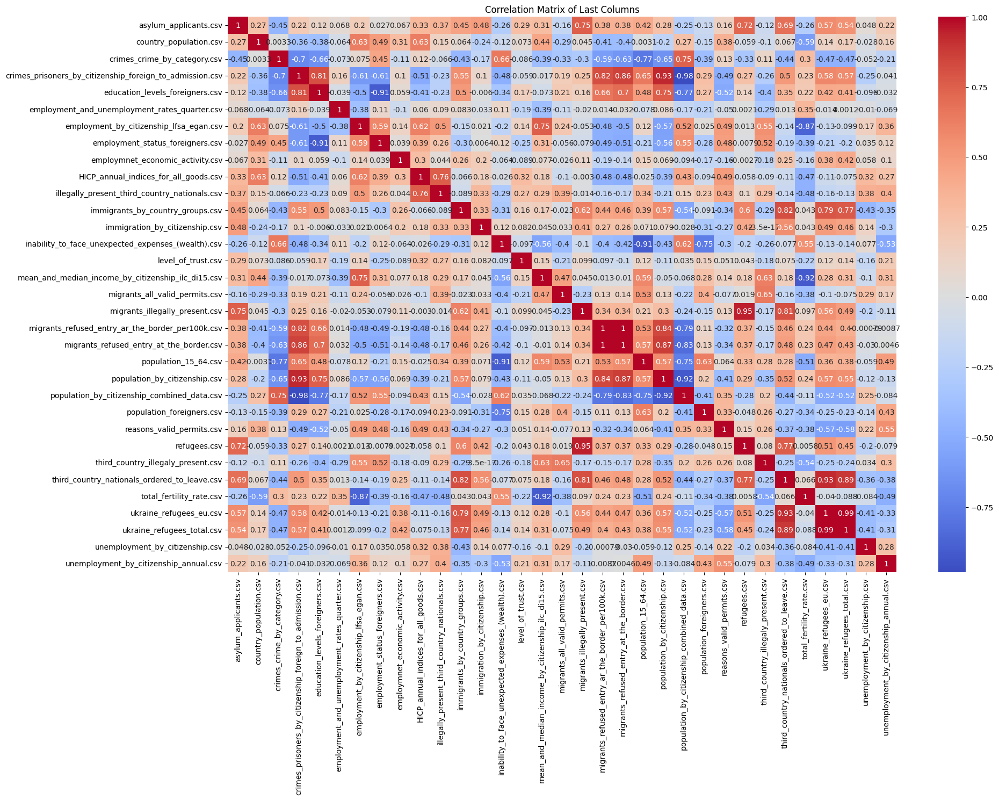

In [2]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

folder_path = r'../processed_data'

value_column = {}

for filename in os.listdir(folder_path):
    file_path = os.path.join(folder_path, filename)
    
    if not os.path.isfile(file_path) or not filename.endswith('.csv'):
        continue
    
    try:
        df = pd.read_csv(file_path)
        last_col_name = df.columns[-1]
        last_col_data = df.iloc[:, -1]
        
        value_column[filename] = last_col_data.reset_index(drop=True)

    except Exception as e:
        print(f"Error processing {filename}: {e}")

combined_df = pd.DataFrame(value_column)
combined_df.dropna(inplace=True)
corr_matrix = combined_df.corr(numeric_only=True)

plt.figure(figsize=(20, 15))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Last Columns')
plt.tight_layout()
plt.show()

In [13]:
!pip install statsmodels
import pandas as pd
import plotly.express as px

imm_df = pd.read_csv(r'../processed_data/migrants_all_valid_permits.csv')
crime_df = pd.read_csv(r'../processed_data/crimes_crime_by_category.csv')

crime_df = crime_df[~crime_df['geo'].str.contains('Total')]
imm_df = imm_df[~imm_df['geo'].str.contains('Total')]

crime_rate = crime_df.columns[-1]
immigrants = imm_df.columns[-1]

crime_grouped = crime_df.groupby(['geo', 'year'])[crime_rate].sum().reset_index()
imm_grouped = imm_df.groupby(['geo', 'year'])[immigrants].sum().reset_index()


In [14]:
imm_grouped['year'] += 2  # efekt po 2 latach

merged_df = pd.merge(crime_grouped, imm_grouped, on=['geo', 'year'], how='inner')

fig = px.scatter(merged_df, x=immigrants, y=crime_rate, color='geo',
                 trendline="ols", title="Związek między imigracją a przestępczością (z opóźnieniem)")
fig.show()


In [15]:
import plotly.graph_objects as go
import numpy as np

lags = list(range(0, 7))
correlations = []
correlations_by_country = {}

for lag in lags:
    imm_lagged = imm_grouped.copy()
    imm_lagged['year'] += lag

    merged = pd.merge(crime_grouped, imm_lagged, on=['geo', 'year'], how='inner')

    corr = merged[crime_rate].corr(merged[immigrants])
    correlations.append(corr)

    for country in merged['geo'].unique():
        country_data = merged[merged['geo'] == country]
        print(country_data)
        if country not in correlations_by_country:
            correlations_by_country[country] = []
        country_corr = country_data[crime_rate].corr(country_data[immigrants])
        correlations_by_country[country].append(country_corr)

fig1 = px.line(x=lags, y=correlations, markers=True)
fig1.update_layout(
    title='Correlation between Immigration and Crime by Time Lag',
    xaxis_title='Lag (years)',
    yaxis_title='Correlation Coefficient',
    xaxis=dict(tickmode='linear')
)

fig2 = go.Figure()
if 'Sweden' in correlations_by_country:
    fig2.add_trace(go.Scatter(x=lags, y=correlations_by_country['Sweden'], mode='lines+markers', name='Sweden'))

fig2.update_layout(
    title='Correlation between Immigration and Crime in Sweden by Time Lag',
    xaxis_title='Lag (years)',
    yaxis_title='Correlation Coefficient',
    xaxis=dict(tickmode='linear')
)

fig1.show()
fig2.show()

best_lag = lags[np.argmax(np.abs(correlations))]
print(f"Strongest correlation occurs with a lag of {best_lag} years (r = {correlations[np.argmax(np.abs(correlations))]:.3f})")

best_country_lag = lags[np.argmax(np.abs(correlations_by_country['Sweden']))]
print(f"Sweden: Strongest correlation at {best_country_lag} years lag (r = {correlations_by_country['Sweden'][np.argmax(np.abs(correlations_by_country['Sweden']))]:.3f})")

       geo  year  Crimes num  Migrants number per 100k inhabitants
0  Austria  2014     3573.58                               5865.41
1  Austria  2015     3397.45                               5329.12
2  Austria  2016     4011.98                               5029.78
3  Austria  2017     3634.96                               5277.49
4  Austria  2018     3338.02                               5414.12
5  Austria  2019     3450.72                               5430.45
6  Austria  2020     3051.09                               5543.39
7  Austria  2021     2810.81                               5765.11
8  Austria  2022     3413.34                               5709.49
        geo  year  Crimes num  Migrants number per 100k inhabitants
9   Belgium  2014     4979.90                               3066.92
10  Belgium  2015     5117.61                               3044.24
11  Belgium  2016     5383.18                               3145.16
12  Belgium  2017     5264.43                             

Strongest correlation occurs with a lag of 3 years (r = 0.084)
Sweden: Strongest correlation at 4 years lag (r = -0.984)
